In [15]:
import pandas as pd
import os

In [16]:
# Chemins d'accès
CTD_PATH = r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\Données brutes"
BARO_PATH = r'Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\1 - Données BARO\Gourdon baro\Patm Calès et Thémines.xlsx'
OLDDATA_PATH = "Y:/MISSIONS/Eau/1 - Projet Hydrogéologique Ouysse/3 - Hydrodynamique/0 - Stations en continu/Ouysse - Calès/"


In [17]:
def lire_fichier(filenum, path, skiprows=63):
    # Rechercher le fichier correspondant
    nom_fichier = [f for f in os.listdir(path) if f"Ouysse_{filenum}" in f and f"Ouysse_{filenum}" == f[:len(f"Ouysse_{filenum}")]]
    if not nom_fichier:
        raise FileNotFoundError(f"Aucun fichier trouvé pour Ouysse_{filenum} dans {path}")
    
    # Lecture du fichier CSV
    df = pd.read_csv(os.path.join(path, nom_fichier[0]), sep=';', encoding='latin1', skiprows=skiprows)
    
    # Supprimer la dernière ligne si elle est vide ou incorrecte
    df = df.iloc[:-1]
    
    # Conversion explicite des dates
    sample_date = df['Date/time'].iloc[0]
    if '/' in sample_date and sample_date[2] == '/':  
        df['Date/time'] = pd.to_datetime(df['Date/time'], dayfirst=True, errors='coerce')
    else: 
        df['Date/time'] = pd.to_datetime(df['Date/time'], format='%Y/%m/%d %H:%M:%S', errors='coerce')
    
    # Arrondir les dates à l'heure la plus proche
    df['Date/time'] = df['Date/time'].dt.round('H')
    
    # Gestion de la conductivité : conversion en µS/cm si nécessaire
    if '2:Cond. spéc.[ms/cm]' in df.columns:
        # Appliquer la correction uniquement si le type est 'object' (chaîne de caractères)
        if df['2:Cond. spéc.[ms/cm]'].dtype == 'object':
            df['2:Cond. spéc.[ms/cm]'] = df['2:Cond. spéc.[ms/cm]'].str.replace(',', '.').str.strip()
        # Convertir en numérique et multiplier par 1000 pour µS/cm
        df['2:Cond. spéc.[ms/cm]'] = pd.to_numeric(df['2:Cond. spéc.[ms/cm]'], errors='coerce') * 1000
        df.rename(columns={'2:Cond. spéc.[ms/cm]': '2:Cond. spéc.[µS/cm]'}, inplace=True)
    
    # Remplacement des virgules par des points et conversion en numérique pour les autres colonnes
    for col in df.columns[1:]:  # Ignorer la colonne 'Date/time'
        if df[col].dtype == 'object':  # Vérifier si la colonne contient des chaînes de caractères
            df[col] = df[col].str.replace(',', '.').str.strip()  # Remplacer les virgules et enlever les espaces
        df[col] = pd.to_numeric(df[col], errors='coerce')  # Convertir en float en ignorant les erreurs
    
    return df


In [18]:
#Correction Barométrique

# Lire les données barométriques à partir du fichier Excel
baro_data = pd.read_excel(BARO_PATH)

# Initialiser un DataFrame vide pour stocker les données fusionnées
final_df = pd.DataFrame()

# Boucle pour traiter les fichiers CTD
for num in range(1, 48+1):  # Modifier la plage selon vos fichiers
    filenum = str(num)  # Convertir le numéro en chaîne

    # Lire les données CTD
    CTD = lire_fichier(filenum, CTD_PATH, skiprows=63)

    # Fusionner avec les données Baro sur la base des dates
    merged_df = pd.merge(CTD, baro_data[['DATE', 'Patm Ouysse Calès [hPa]']], left_on='Date/time', right_on='DATE', how='left')

    # Calcul de la hauteur piézométrique : correction par soustraction de la pression barométrique
    # On suppose que la pression CTD est en cmH2O et barométrique en hPa (conversion nécessaire)
    merged_df['Niveau_(cm)'] = merged_df['Pression[cmH2O]'] - (merged_df['Patm Ouysse Calès [hPa]'])
    # Renommer la colonne de conductivité pour la rendre plus claire
    merged_df.rename(columns={'2:Cond. spéc.[µS/cm]': 'Cond_(µS/cm)', 'Température[°C]': 'Temp_(°C)'}, inplace=True)

    # Conserver les colonnes 'Date/time', 'Niveau_(cm)', 'Pression[cmH2O]' (CTD), 'Patm Ouysse Calès [hPa]', 'Cond_(µS/cm)'
    final_df = pd.concat([final_df, merged_df[['Date/time', 'Niveau_(cm)', 'Pression[cmH2O]', 'Patm Ouysse Calès [hPa]', 'Cond_(µS/cm)','Temp_(°C)']]], ignore_index=True)

# Afficher un aperçu des premières lignes du DataFrame final
final_df


,Date/time,Niveau_(cm),Pression[cmH2O],Patm Ouysse Calès [hPa],Cond_(µS/cm),Temp_(°C)
0,2019-02-27 13:00:00,28.555956,1061.091667,1032.535711,507.0,11.563333
1,2019-02-27 14:00:00,29.373872,1060.916667,1031.542795,507.0,11.793333
2,2019-02-27 15:00:00,29.293205,1060.041667,1030.748462,507.0,11.970000
3,2019-02-27 16:00:00,28.383454,1058.933333,1030.549879,507.0,12.080000
4,2019-02-27 17:00:00,27.934162,1058.583333,1030.649171,508.0,12.093333
...,...,...,...,...,...,...
50611,2024-11-14 12:00:00,81.615706,1114.350000,1032.734294,202.0,11.070000
50612,2024-11-14 13:00:00,81.552747,1113.592000,1032.039253,202.0,11.710000
50613,2024-11-14 14:00:00,81.407205,1112.950000,1031.542795,202.0,12.090000
50614,2024-11-14 15:00:00,80.672788,1112.017000,1031.344212,203.0,12.340000


Last date in old data: 2019-02-27 13:00:00
First date in new data: 2019-02-27 13:00:00


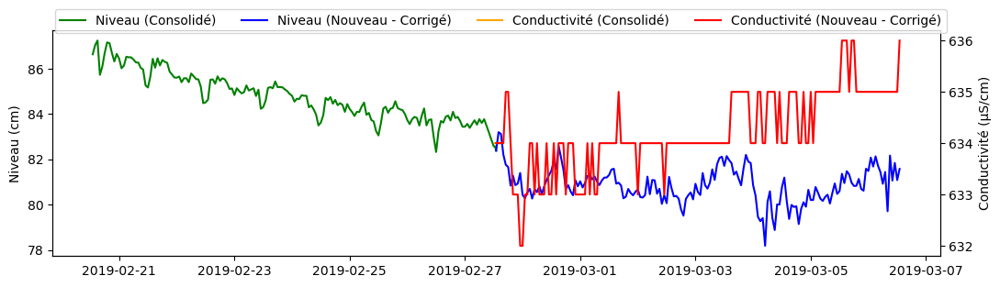

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Step 1: Load the old consolidated data (Excel file)
OLDDATA_PATH = r"Y:/MISSIONS/Eau/1 - Projet Hydrogéologique Ouysse/3 - Hydrodynamique/0 - Stations en continu/Ouysse - Calès/Gaetan"
olddatata_df = pd.read_excel(os.path.join(OLDDATA_PATH, "OuysseCales_consolide.xlsx"))

# Load the final_df (new data, from your previous CTD + Baro merge)
# Assuming 'final_df' is already created and available

# Ensure both dataframes have a 'DATE' column in datetime format
olddatata_df['DATE'] = pd.to_datetime(olddatata_df['DATE'])
final_df['DATE'] = pd.to_datetime(final_df['Date/time'])

# Step 2: Identify the junction dates
last_date_old = olddatata_df['DATE'].max()  # Last date in old data
first_date_new = final_df['DATE'].min()     # First date in new data

print(f"Last date in old data: {last_date_old}")
print(f"First date in new data: {first_date_new}")

# Step 3: Filter data around the junction (7 days before the last old date and 7 days after the first new date)
old_data_filtered = olddatata_df[olddatata_df['DATE'] >= (last_date_old - pd.Timedelta(days=7))]
new_data_filtered = final_df[final_df['DATE'] <= (first_date_new + pd.Timedelta(days=7))]

# Step 4: Calculate the shift for water level (Niveau)
dernier_niveau_old = old_data_filtered['Niveau'].dropna().iloc[-1]  # Last valid water level from old data
premier_niveau_new = new_data_filtered['Niveau_(cm)'].dropna().iloc[0]  # First valid water level from new data
shift_niveau = dernier_niveau_old - premier_niveau_new  # Calculate the shift

# Apply the shift to the new data for water level
final_df['Niveau_corr'] = final_df['Niveau_(cm)'] + shift_niveau

# Step 5: Calculate the shift for conductivity (Cond.)
derniere_cond_old = old_data_filtered['Conducti'].dropna().iloc[-1]  # Last valid conductivity from old data
premiere_cond_new = new_data_filtered['Cond_(µS/cm)'].dropna().iloc[0]  # First valid conductivity from new data
shift_cond = derniere_cond_old - premiere_cond_new  # Calculate the shift for conductivity

# Apply the shift to the new data for conductivity
final_df['Conducti_corr'] = final_df['Cond_(µS/cm)'] + shift_cond

# Step 6: Filter the corrected new data (same 7-day window)
new_data_filtered_corr = final_df[final_df['DATE'] <= (first_date_new + pd.Timedelta(days=7))]

# Step 7: Plot the corrected data along with the old data
fig, ax1 = plt.subplots(figsize=(11, 3))

# Plot corrected water level (Niveau)
ax1.plot(old_data_filtered['DATE'], old_data_filtered['Niveau'], label='Niveau (Consolidé)', color='green')
ax1.plot(new_data_filtered_corr['DATE'], new_data_filtered_corr['Niveau_corr'], label='Niveau (Nouveau - Corrigé)', color='blue')
ax1.set_ylabel('Niveau (cm)')
ax1.tick_params(axis='y')

# Plot corrected conductivity on the second axis
ax2 = ax1.twinx()
ax2.plot(old_data_filtered['DATE'], old_data_filtered['Conducti'], label='Conductivité (Consolidé)', color='orange')
ax2.plot(new_data_filtered_corr['DATE'], new_data_filtered_corr['Conducti_corr'], label='Conductivité (Nouveau - Corrigé)', color='red')
ax2.set_ylabel('Conductivité (µS/cm)')
ax2.tick_params(axis='y')

# Add legends and adjust layout
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=4)
plt.tight_layout()

# Display the plot
plt.show()


In [10]:
import pandas as pd
import os

# Load the old consolidated data (Excel file)
OLDDATA_PATH = r"Y:/MISSIONS/Eau/1 - Projet Hydrogéologique Ouysse/3 - Hydrodynamique/0 - Stations en continu/Ouysse - Calès/Gaetan"
old_data_path = os.path.join(OLDDATA_PATH, "OuysseCales_consolide.xlsx")
olddatata_df = pd.read_excel(old_data_path)

# Assuming 'final_df' is your corrected new data (after applying shifts)
# Ensure 'DATE' column in both DataFrames is in datetime format
olddatata_df['DATE'] = pd.to_datetime(olddatata_df['DATE'])
final_df['DATE'] = pd.to_datetime(final_df['Date/time'])  # Ensure datetime conversion

# Check if 'Temp_(°C)' exists in final_df
if 'Temp_(°C)' in final_df.columns:
    # Include temperature if available
    final_df_renamed = final_df[['DATE', 'Niveau_corr', 'Conducti_corr', 'Temp_(°C)']].rename(
        columns={'Niveau_corr': 'Niveau', 'Conducti_corr': 'Conducti', 'Temp_(°C)': 'Temp'}
    )
else:
    # Exclude temperature if not available
    final_df_renamed = final_df[['DATE', 'Niveau_corr', 'Conducti_corr']].rename(
        columns={'Niveau_corr': 'Niveau', 'Conducti_corr': 'Conducti'}
    )

# Merge old and new data
new_data_merged = pd.merge(
    olddatata_df, final_df_renamed, on='DATE', how='outer', suffixes=('_old', '')
)

# Fill updated values where available; otherwise, keep old data
new_data_merged['Niveau'] = new_data_merged['Niveau'].combine_first(new_data_merged['Niveau_old'])
new_data_merged['Conducti'] = new_data_merged['Conducti'].combine_first(new_data_merged['Conducti_old'])

if 'Temp' in new_data_merged.columns:
    new_data_merged['Temp'] = new_data_merged['Temp'].combine_first(new_data_merged['Temp_old'])

# Drop temporary columns used for merging
columns_to_drop = ['Niveau_old', 'Conducti_old']
if 'Temp' in new_data_merged.columns:
    columns_to_drop.append('Temp_old')
new_data_merged = new_data_merged.drop(columns=columns_to_drop)

# Calculate discharge (Q) using the correct rating curve
new_data_merged['Niveau_m'] = new_data_merged['Niveau'] / 100

# Define conditions for the rating curves
low_level_condition = new_data_merged['Niveau_m'] < 1
high_level_condition = new_data_merged['Niveau_m'] >= 1

# Apply the rating curve formulas
new_data_merged.loc[low_level_condition, 'Q'] = (
    7.7563 * (new_data_merged.loc[low_level_condition, 'Niveau_m']) ** 7.6404
)
new_data_merged.loc[high_level_condition, 'Q'] = (
    10.227 * (new_data_merged.loc[high_level_condition, 'Niveau_m']) ** 2
    + 7.3348 * (new_data_merged.loc[high_level_condition, 'Niveau_m'])
    - 10
)

# Ensure no negative discharge values
new_data_merged['Q'] = new_data_merged['Q'].apply(lambda x: max(x, 0) if pd.notna(x) else x)

# Save the updated dataset
NEW_CONSOLIDATED_PATH = os.path.join(OLDDATA_PATH, "OuysseCales_consolide_updated.xlsx")
new_data_merged.to_excel(NEW_CONSOLIDATED_PATH, index=False)

print(f"New consolidated data with discharge and temperature preserved has been saved to {NEW_CONSOLIDATED_PATH}")


New consolidated data with discharge and temperature preserved has been saved to Y:/MISSIONS/Eau/1 - Projet Hydrogéologique Ouysse/3 - Hydrodynamique/0 - Stations en continu/Ouysse - Calès/Gaetan\OuysseCales_consolide_updated.xlsx


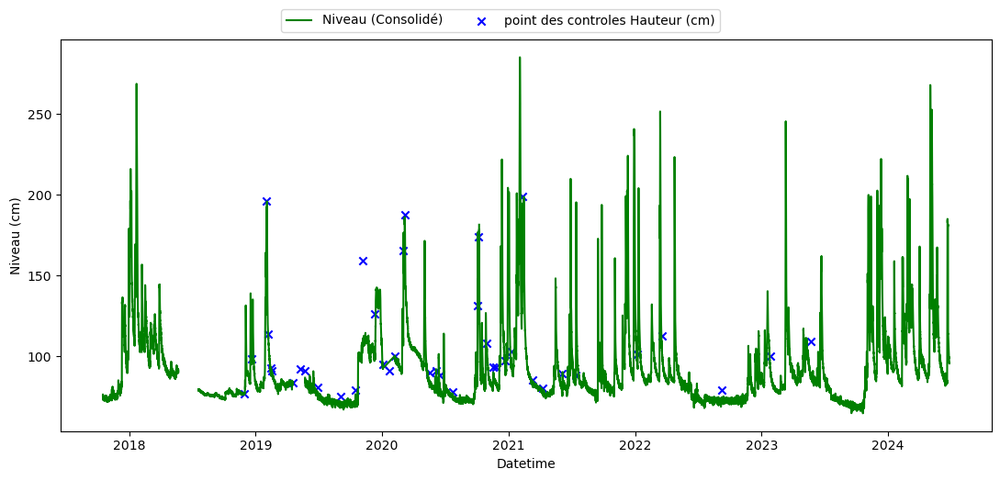

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Path to the newly saved consolidated data
OLDDATA_PATH = r"Y:/MISSIONS/Eau/1 - Projet Hydrogéologique Ouysse/3 - Hydrodynamique/0 - Stations en continu/Ouysse - Calès/Gaetan"
new_consolidated_path = os.path.join(OLDDATA_PATH, "OuysseCales_consolide_updated.xlsx")
punctual_data_path = os.path.join(OLDDATA_PATH, "punctual_measurements.xlsx")

# Load the new consolidated data
new_consolidated_df = pd.read_excel(new_consolidated_path)
punctual_df = pd.read_excel(punctual_data_path)

# Ensure 'DATE' column in consolidated data and 'Jour' column in punctual data are in datetime format
new_consolidated_df['DATE'] = pd.to_datetime(new_consolidated_df['DATE'])
punctual_df['Datetime'] = pd.to_datetime(punctual_df['Jour'], dayfirst=True, errors='coerce')

# Plot the consolidated data (Niveau and Conductivity) as lines and the punctual data as points
fig, ax1 = plt.subplots(figsize=(11, 5))

# Plot water level (Niveau) from consolidated data as a line
ax1.plot(new_consolidated_df['DATE'], new_consolidated_df['Niveau'], label='Niveau (Consolidé)', color='green')
ax1.set_ylabel('Niveau (cm)')
ax1.set_xlabel('Datetime')
ax1.tick_params(axis='y')

# Plot punctual measurements for water level as points (control points)
ax1.scatter(punctual_df['Datetime'], punctual_df['Hauteur (cm)'], color='blue', label='point des controles Hauteur (cm)', marker='x')

# Add legends and adjust layout
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=4)
plt.tight_layout()

# Display the plot
plt.show()


C:\Users\stagiaire\AppData\Local\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



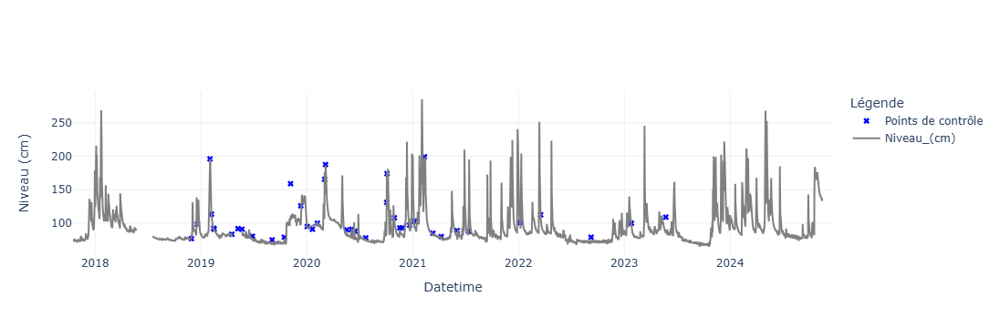

In [13]:
import pandas as pd
import plotly.graph_objects as go
import os

# Path to the newly saved consolidated data
NEW_CONSOLIDATED_PATH = os.path.join(r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.xlsx")
punctual_data_path = os.path.join(r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\punctual_measurements.xlsx")

# Load the new consolidated data
new_consolidated_df = pd.read_excel(NEW_CONSOLIDATED_PATH)
punctual_df = pd.read_excel(punctual_data_path)

# Ensure 'DATE' column in consolidated data and 'Jour' column in punctual data are in datetime format
new_consolidated_df['DATE'] = pd.to_datetime(new_consolidated_df['DATE'])
punctual_df['Datetime'] = pd.to_datetime(punctual_df['Jour'], dayfirst=True, errors='coerce')

# Create a Plotly figure
fig = go.Figure()

# Add scatter points for punctual measurements (control points)
fig.add_trace(go.Scatter(
    x=punctual_df['Datetime'],
    y=punctual_df['Hauteur (cm)'],
    mode='markers',
    name='Points de contrôle',
    marker=dict(color='blue', symbol='x')
))

# Add line for consolidated water level (Niveau)
fig.add_trace(go.Scatter(
    x=new_consolidated_df['DATE'],
    y=new_consolidated_df['Niveau'],
    mode='lines',
    name='Niveau_(cm)',
    line=dict(color='grey', width=2, dash='solid')
))

# Customize layout
fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Niveau (cm)',
    legend_title='Légende',
    template='plotly_white'
)

# Show the figure
fig.show()


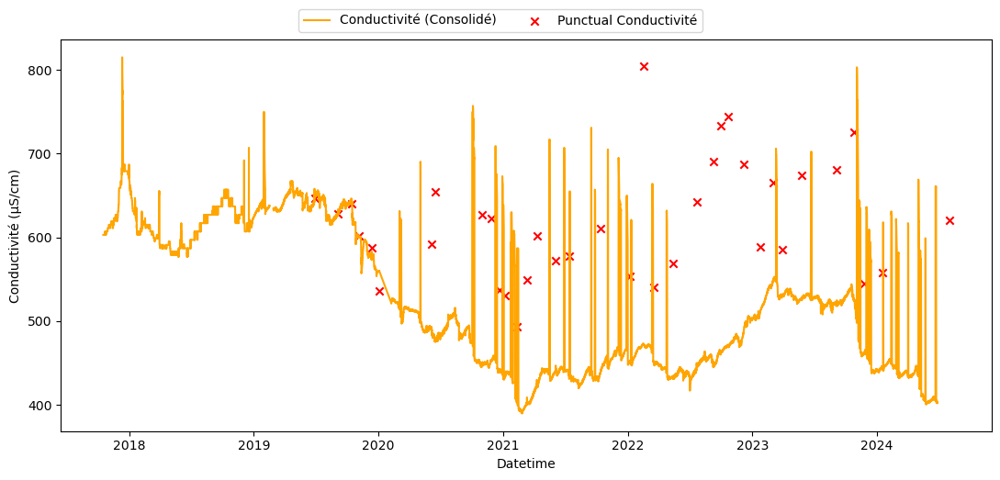

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Path to the newly saved consolidated data
OLDDATA_PATH = r"Y:/MISSIONS/Eau/1 - Projet Hydrogéologique Ouysse/3 - Hydrodynamique/0 - Stations en continu/Ouysse - Calès/Gaetan"
new_consolidated_path = os.path.join(OLDDATA_PATH, "OuysseCales_consolide_updated.xlsx")
punctual_data_path = os.path.join(OLDDATA_PATH, "punctual_measurements.xlsx")

# Load the new consolidated data
new_consolidated_df = pd.read_excel(new_consolidated_path)
punctual_df = pd.read_excel(punctual_data_path)

# Ensure 'DATE' column in consolidated data and 'Jour' column in punctual data are in datetime format
new_consolidated_df['DATE'] = pd.to_datetime(new_consolidated_df['DATE'])
punctual_df['Datetime'] = pd.to_datetime(punctual_df['Jour'], dayfirst=True, errors='coerce')

# Plot the consolidated data (Conductivity) as a line and the punctual data as points
fig, ax = plt.subplots(figsize=(11, 5))

# Plot conductivity from consolidated data as a line
ax.plot(new_consolidated_df['DATE'], new_consolidated_df['Conducti'], label='Conductivité (Consolidé)', color='orange')

# Plot punctual measurements for conductivity as points (control points)
ax.scatter(punctual_df['Datetime'], punctual_df['Conductivité'], color='red', label='Punctual Conductivité', marker='x')

# Set labels and titles
ax.set_ylabel('Conductivité (µS/cm)')
ax.set_xlabel('Datetime')

# Add legends and adjust layout
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=2)
plt.tight_layout()

# Display the plot
plt.show()


Date : 2020-06-05 00:00:00, Décalage appliqué : 100.0 µS/cm
Date : 2020-06-16 00:00:00, Décalage appliqué : 77.0 µS/cm
Date : 2020-10-29 15:00:00, Décalage appliqué : 0.0 µS/cm
Date : 2020-11-25 15:00:00, Décalage appliqué : -7.0 µS/cm
Date : 2020-12-21 13:00:00, Décalage appliqué : -76.0 µS/cm
Date : 2021-01-07 13:00:00, Décalage appliqué : 0.0 µS/cm
Date : 2021-02-10 13:00:00, Décalage appliqué : -182.0 µS/cm
Date : 2021-03-11 12:00:00, Décalage appliqué : 230.0 µS/cm
Date : 2021-04-09 13:00:00, Décalage appliqué : 31.0 µS/cm
Date : 2021-06-03 13:00:00, Décalage appliqué : -40.0 µS/cm
Date : 2021-07-12 14:00:00, Décalage appliqué : 13.0 µS/cm
Date : 2021-10-13 14:00:00, Décalage appliqué : 24.0 µS/cm
Date : 2022-01-06 15:00:00, Décalage appliqué : -68.0 µS/cm
Date : 2022-03-18 14:00:00, Décalage appliqué : -13.0 µS/cm
Date : 2022-05-12 10:00:00, Décalage appliqué : 46.0 µS/cm
Date : 2022-07-21 14:00:00, Décalage appliqué : 64.0 µS/cm
Date : 2022-09-08 16:00:00, Décalage appliqué : 45

C:\Users\stagiaire\AppData\Local\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Graphique interactif sauvegardé dans : Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\\Ouysse - Calès\Gaetan\Graphique_conductivté et points_de_controles.html


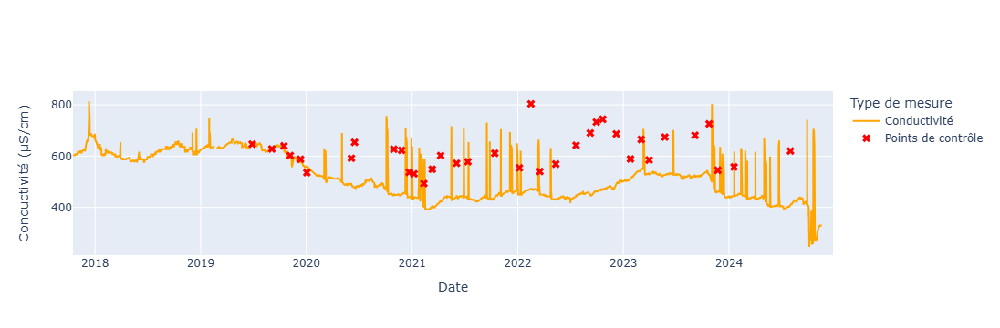

In [14]:
import pandas as pd
import plotly.graph_objects as go
import os

# Chemin vers le fichier de données
data_path = os.path.join(
    r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.xlsx"
)
punctual_data_path = os.path.join(
    r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\punctual_measurements.xlsx"
)

# Charger les données
data = pd.read_excel(data_path)
punctual_df = pd.read_excel(punctual_data_path)

# Conversion des dates en datetime
data['DATE'] = pd.to_datetime(data['DATE'], errors='coerce')
punctual_df['Datetime'] = pd.to_datetime(punctual_df['Jour'], dayfirst=True, errors='coerce')

# Créer la colonne "Conductivité" avec comblement des données manquantes en utilisant seulement Conducti
if 'Conductivité' not in data.columns:
    data['Conductivité'] = data['Conducti'].copy()  # Copier les valeurs de Conducti directement dans Conductivité

# Appliquer les corrections uniquement pour les points marqués "Oui"
for index, row in punctual_df.iterrows():
    point_date = row['Datetime']
    point_value = row['Conductivité']
    apply_correction = row.get("Correction")  # Vérifier la colonne "Correction"

    if pd.isna(point_value) or apply_correction != "Oui":
        continue  # Passer les points sans correction ou avec valeur NaN

    # Trouver la mesure la plus proche dans les données consolidées
    nearest_measure_index = (data['DATE'] - point_date).abs().idxmin()
    nearest_measure_value = data.at[nearest_measure_index, 'Conductivité']

    # Si la mesure est trop éloignée dans le temps, ne pas appliquer la correction
    if abs((data['DATE'][nearest_measure_index] - point_date).total_seconds()) > 3600:
        continue

    # Calculer le décalage et l'appliquer aux données après ce point de contrôle
    decalage = point_value - nearest_measure_value
    print(f"Date : {point_date}, Décalage appliqué : {decalage} µS/cm")

    # Appliquer le décalage à toutes les mesures après la date du point de contrôle
    data.loc[data['DATE'] >= point_date, 'Conductivité'] += decalage

# Visualisation interactive avec Plotly
fig = go.Figure()

# Tracer les données de Conducti et Conductivité corrigée
fig.add_trace(go.Scatter(x=data['DATE'], y=data['Conducti'], mode='lines', name='Conductivité', line=dict(color='orange')))
#fig.add_trace(go.Scatter(x=data['DATE'], y=data['Conductivité'], mode='lines', name='Conductivité corrigée', line=dict(color='green')))

# Ajouter les points de contrôle
fig.add_trace(go.Scatter(
    x=punctual_df['Datetime'],
    y=punctual_df['Conductivité'],
    mode='markers',
    name='Points de contrôle',
    marker=dict(symbol='x', color='red', size=8)
))

# Configuration du graphique
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Conductivité (µS/cm)',
    legend_title='Type de mesure'
)

# Exporter le graphique pour inspection
html_output_path = (r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\\Ouysse - Calès\Gaetan\Graphique_conductivté et points_de_controles.html")
fig.write_html(html_output_path)
print(f"Graphique interactif sauvegardé dans : {html_output_path}")

# Afficher le graphique
fig.show()


In [11]:
import pandas as pd
import plotly.graph_objects as go
import os

# Chemin vers le fichier de données
data_path = os.path.join(
    r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.xlsx"
)

# Charger les données principales
data = pd.read_excel(data_path)

# Conversion des dates en datetime
data['DATE'] = pd.to_datetime(data['DATE'], errors='coerce')

# Vérifier que Conducti existe et créer les colonnes pour les versions nettoyées
if 'Conducti' in data.columns:
    data['Conductivité_originale'] = data['Conducti'].copy()
else:
    raise KeyError("La colonne 'Conducti' n'existe pas dans le fichier de données.")

data['Conductivité_nettoyee'] = data['Conductivité_originale'].copy()

# Définir les périodes spécifiques pour suppression
periods_to_remove = [
    ("2021-01-23 12:00", "2021-01-26 15:00"),
    ("2021-01-29 08:00", "2021-02-04 16:00"),
    ("2021-02-10 03:00", "2021-02-14 14:00"),
    ("2023-11-03 00:00", "2023-11-07 07:00"),
    ("2023-11-09 21:00", "2023-11-14 02:00"),
    ("2023-12-11 09:00", "2023-12-15 08:00"),
    ("2024-05-01 13:00", "2024-05-09 19:00")
    
]

# Supprimer les données de ces périodes en les remplaçant par NaN
for start, end in periods_to_remove:
    mask = (data['DATE'] >= pd.to_datetime(start)) & (data['DATE'] <= pd.to_datetime(end))
    data.loc[mask, 'Conductivité_nettoyee'] = None

# Appliquer le filtre IQR sur une fenêtre glissante pour détecter les outliers
window_size = '500H'  # Fenêtre de 48 heures
for i in range(len(data)):
    # Définir la fenêtre de temps autour de chaque point
    start_date = data['DATE'].iloc[i] - pd.Timedelta(window_size)
    end_date = data['DATE'].iloc[i] + pd.Timedelta(window_size)
    
    # Extraire les données dans cette fenêtre
    window_data = data[(data['DATE'] >= start_date) & (data['DATE'] <= end_date)]['Conductivité_nettoyee'].dropna()
    
    # Calculer le IQR et définir les bornes pour filtrer les outliers
    Q1 = window_data.quantile(0.25)
    Q3 = window_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 0.8 * IQR
    upper_bound = Q3 + 0.8 * IQR
    
    # Filtrer les outliers : si en dehors des bornes, marquer comme NaN
    if data['Conductivité_nettoyee'].iloc[i] < lower_bound or data['Conductivité_nettoyee'].iloc[i] > upper_bound:
        data.at[i, 'Conductivité_nettoyee'] = None

# Interpoler les valeurs manquantes dans les données nettoyées après le filtre IQR
data.set_index('DATE', inplace=True)
data['Conductivité_nettoyee'] = data['Conductivité_nettoyee'].interpolate(method='time')
data.reset_index(inplace=True)

# Visualisation interactive avec Plotly
fig = go.Figure()

# Ajouter les données d'origine
fig.add_trace(go.Scatter(
    x=data['DATE'], y=data['Conductivité_originale'],
    mode='lines', name='Conductivité (originale)',
    line=dict(color='orange')
))

# Ajouter les données nettoyées après suppression et filtre IQR
fig.add_trace(go.Scatter(
    x=data['DATE'], y=data['Conductivité_nettoyee'],
    mode='lines', name='Conductivité (nettoyée après suppression et IQR)',
    line=dict(color='blue')
))

# Configuration du graphique
fig.update_layout(
    title='Visualisation des données de conductivité avec suppression des périodes spécifiques et filtre IQR',
    xaxis_title='Date',
    yaxis=dict(title='Conductivité (µS/cm)'),
    legend_title='Type de mesure'
)

# Exporter le graphique pour inspection
html_output_path = (r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.html"
)
fig.write_html(html_output_path)
print(f"Graphique interactif sauvegardé dans : {html_output_path}")

# Sauvegarder les données nettoyées dans un fichier Excel
output_path = os.path.join(
    r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.xlsx"
)
data.to_excel(output_path, index=False)
print(f"Données nettoyées sauvegardées dans : {output_path}")


C:\Users\stagiaire\AppData\Local\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



Graphique interactif sauvegardé dans : Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.html
Données nettoyées sauvegardées dans : Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCales_consolide_updated.xlsx


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Chemins vers les fichiers
data_path = r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\OuysseCale_consolide_updated.xlsx"
rainfall_data_path = r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\Pluie_BV_Ouysse.csv"

# Charger les données
data = pd.read_excel(data_path)
rainfall_data = pd.read_csv(rainfall_data_path)

# Conversion des dates en datetime
data['DATE'] = pd.to_datetime(data['DATE'], errors='coerce')
rainfall_data['Date'] = pd.to_datetime(rainfall_data['Date'], errors='coerce')

# Calculer la moyenne mobile pour la température et la conductivité
data['Temp_Moving_Avg'] = data['Temp'].rolling(window=24, center=True).mean()
data['Conductivité_Moving_Avg'] = data['Conductivité_nettoyee'].rolling(window=24, center=True).mean()

# Ajustement des dates pour la plage des données
start_date = data['DATE'].min() - pd.Timedelta(days=7)
end_date = data['DATE'].max() + pd.Timedelta(days=7)

rainfall_data = rainfall_data[(rainfall_data['Date'] >= start_date) & (rainfall_data['Date'] <= end_date)]
data = data[(data['DATE'] >= start_date) & (data['DATE'] <= end_date)]

# Création du graphique
fig, axes = plt.subplots(2, 1, figsize=(15, 8), sharex=True, gridspec_kw={'hspace': 0.1})

# --- Graphe 1 : Débit et Précipitations ---
ax1 = axes[0]
ax2 = ax1.twinx()

ax1.plot(data['DATE'], data['Q'], color='lightseagreen')
ax1.set_ylabel('Débit (m³/s)', color='lightseagreen')
ax1.tick_params(axis='y', labelcolor='lightseagreen')

ax2.bar(
    rainfall_data['Date'], rainfall_data['Precipitation (mm)'],
    width=0.8, color='royalblue', label='Précipitations (mm)', align='center'
)
ax2.invert_yaxis()  # Inverser l'axe des précipitations
ax2.set_ylabel('Précipitations (mm)', color='royalblue')
ax2.tick_params(axis='y', labelcolor='royalblue')

# --- Graphe 2 : Conductivité corrigée et Température ---
ax3 = axes[1]
ax4 = ax3.twinx()

ax3.plot(data['DATE'], data['Conductivité_Moving_Avg'], color='black', label='Conductivité (µS/cm)')
ax3.set_ylabel('Conductivité corrigée (µS/cm)', color='black')
ax3.tick_params(axis='y', labelcolor='black')

ax4.plot(data['DATE'], data['Temp_Moving_Avg'], color='crimson', label='Température (°C)')
ax4.set_ylabel('Température (°C)', color='crimson')
ax4.tick_params(axis='y', labelcolor='crimson')

# Ajustement des marges et sauvegarde
plt.subplots_adjust(hspace=0.2)
svg_output_path = r"Y:\MISSIONS\Eau\1 - Projet Hydrogéologique Ouysse\3 - Hydrodynamique\0 - Stations en continu\Ouysse - Calès\Gaetan\Graphique_Debit_Temp_Conductivite_with_Rainfall.svg"
plt.savefig(svg_output_path, format='svg', dpi=300)
print(f"Graphique sauvegardé en SVG à : {svg_output_path}")

plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'Y:\\MISSIONS\\Eau\\1 - Projet Hydrogéologique Ouysse\\3 - Hydrodynamique\\0 - Stations en continu\\Ouysse - Calès\\Gaetan\\OuysseCale_consolide_updated.xlsx'